The notebook below contains most of the preliminary data clean-up steps necessary to use it for analysis. The raw data file is: **ZOODATA_140923.xlsx**. There is a number of modified files we saved along the way. They are all in the directory **../Data/**. **df2_original_for_SQL.csv** contains mostly 'clean' data. The same is true for **original.csv**. They differ with respect to the types of categorical columns. Two files: **meiotic_false.csv** and 
**meiotic_true.csv** are the result of splitting the original data frame on the column **meiotic** (i.e. whether spindles are meiotic or mitotic). The final two files: **mitotic_anaphase.csv** and **mitotic_metaphase.csv** are the result of and additional data split in file **meiotic_true.csv** on the column **stage** (i.e. stage of the cell cycle).     

Please refer to the file **SpindleZooColumnKey.txt** for the description of columns. 


# 1. Load all necessary libraries

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
pd.set_option('display.mpl_style', 'default') 
%matplotlib inline

import re

In [2]:
import pygal
from IPython.display import SVG


In [3]:
import sklearn as skl
import statsmodels


In [4]:
print pd.__version__
print np.__version__
print pygal.__version__
print statsmodels.__version__
print skl.__version__
print re.__version__

0.15.1
1.9.1
1.5.1
0.5.0
0.15.2
2.2.1


In [5]:
!pip freeze | grep ipython

ipython==3.0.0
ipython-sql==0.3.4


# 2. Load and clean up data

##STEP1: LOAD DATA
Relevant file: **ZOODATA_140923.xlsx**.   
*There are still some values here that are erroneous. Check R code entries files for fixes.*

***df*** is the original data frame. There will be several copies of it along the way. I am keeping the original one in case there will be a fork in analysis. This of course would not work with large data sets.


In [6]:
df=pd.read_excel('../Data/ZOODATA_140923.xlsx')

This is the original data set. There will be a lot of cleaning along the way.

In [7]:
df.head()

,date,image,objective,time PF,# of cells,meiotic,stage,cell diameter (um),Spindle Length_ asters (um),Spindle length_poles (um),...,Distance between chromosomes (um),microscope,fixation,organism,phylum,classification,genome,chromosomes,Day,cleavage type
0,131106,131106batstar_35hpf 5,40x,210 min,1,f,a,177.8215,41.37903,26.13072,...,10.55901,mm40,pf,asterina miniata,echinodermata,bd,811,36,131106,rah
1,131106,131106batstar_35hpf 6,40x,210 min,1,f,m,163.0583,24.85329,18.28827,...,0,mm40,pf,asterina miniata,echinodermata,bd,811,36,131106,rah
2,131106,131106batstar_35hpf 7,40x,210 min,1,f,p,206.0058,35.0889,27.24645,...,na,mm40,pf,asterina miniata,echinodermata,bd,811,36,131106,rah
3,131106,131106batstar_35hpf 10,40x,210 min,1,f,m,194.04,42.39774,42.39774,...,0,mm40,pf,asterina miniata,echinodermata,bd,811,36,131106,rah
4,131106,131106batstar_35hpf 11,40x,210 min,1,f,na,180.3602,na,na,...,na,mm40,pf,asterina miniata,echinodermata,bd,811,36,131106,rah


In [8]:
df.columns.tolist()

[u'date',
 u'image',
 u'objective',
 u'time PF',
 u'# of cells',
 u'meiotic',
 u'stage',
 u'cell diameter (um)',
 u'Spindle Length_ asters (um)',
 u'Spindle length_poles (um)',
 u'spindle width (um)',
 u'spindle aspect ratio_asters (um)',
 u'spindle aspect ratio_poles (um)',
 u'astere-to-pole distance 1 (um)',
 u'aster-to-pole distance 2 (um)',
 u'inner aster diameter 1 (um)',
 u'inner aster diameter 2 (um)',
 u'outer aster diameter 1 (um)',
 u'outer  diameter 2 (um)',
 u'centrosome',
 u'metaphase plate lengt h (um)',
 u'metaphase plate width (um)',
 u'metaphase plate aspect ratio (um)',
 u'polar body diameter 1 (um)',
 u'polar body diameter 2 (um)',
 u'Distance between chromosomes (um)',
 u'microscope',
 u'fixation',
 u'organism',
 u'phylum',
 u'classification',
 u'genome',
 u'chromosomes',
 u'Day',
 u'cleavage type']

Data set (2001 observations in 35 columns):   
* redundant variables: date and day, objective and microscope (that leaves 33 columns)  
* metadata (date/day*, image, objective/microscope, fixation) 4     
* continuous (cell diameter, Spindle Length_ asters, Spindle length_poles, spindle width, spindle aspect ratio_asters, spindle aspect ratio_poles, astere-to-pole distance 1, aster-to-pole distance 2, inner aster diameter 1, inner aster diameter 2, outer aster diameter 1, outer  diameter 2, metaphase plate lengt h, metaphase plate width, metaphase plate aspect ratio, polar body diameter 1, polar body diameter 2, Distance between chromosomes, genome ) 19     
* categorical (meiotic, stage, centrosome, organism, phylum, classification, cleavage type) 7     
* count (# of cells, chromosomes) 2     
* time (date*, time PF) 2     
    
**Classification:**    
MT u'date', 
M u'image', 
T u'time PF',
Co u'# of cells',
Cat u'meiotic',
Cat u'stage',
Cont u'cell diameter (um)',
Cont u'Spindle Length_ asters (um)',
Cont u'Spindle length_poles (um)',
Cont u'spindle width (um)',
Cont u'spindle aspect ratio_asters (um)',
Cont u'spindle aspect ratio_poles (um)',
Cont u'astere-to-pole distance 1 (um)',
Cont u'aster-to-pole distance 2 (um)',
Cont u'inner aster diameter 1 (um)',
Cont u'inner aster diameter 2 (um)',
Cont u'outer aster diameter 1 (um)',
Cont u'outer  diameter 2 (um)',
Cat u'centrosome',
Cont u'metaphase plate lengt h (um)',
Cont u'metaphase plate width (um)',
Cont u'metaphase plate aspect ratio (um)',
Cont u'polar body diameter 1 (um)',
Cont u'polar body diameter 2 (um)',
Cont u'Distance between chromosomes (um)',
M 'microscope',
M u'fixation',
Cat u'organism',
Cat u'phylum',
Cat u'classification',
Cont u'genome',
Co'chromosomes',
Cat u'cleavage type'

In [73]:
df.shape

(2001, 35)

In [74]:
df.tail(2)

,date,image,objective,time PF,# of cells,meiotic,stage,cell diameter (um),Spindle Length_ asters (um),Spindle length_poles (um),...,Distance between chromosomes (um),microscope,fixation,organism,phylum,classification,genome,chromosomes,Day,cleavage type
1999,2012,Hiragi_JCB_Good_Measurements_71,na,na,1,f,m,71.8,na,24.4,...,0,na,na,mus musculus,Chordaya,bd,3481,40,na,ro
2000,2012,Hiragi_JCB_Good_Measurements_72,na,na,1,f,m,73.5,na,23.75,...,0,na,na,mus musculus,Chordaya,bd,3481,40,na,ro


##STEP2: CLEAN UP THE DATA FRAME

This will involve:  
* cleaning up the headers
* cleaning up the values
  
* [MOVED TO A SEPERATE NOTEBOOK - look for a file with a relevant name] try imputing the missing values (random sampling, median or SVD); compare distributions with and without; do it for sklearn only - seperate DF

###Cleaning up the headers:
Get rid of spaces, brackets, hashes; convert to lower case.

In [75]:
df.columns #spaces, brackets

Index([u'date', u'image', u'objective', u'time PF', u'# of cells', u'meiotic', u'stage', u'cell diameter (um)', u'Spindle Length_ asters (um)', u'Spindle length_poles (um)', u'spindle width (um)', u'spindle aspect ratio_asters (um)', u'spindle aspect ratio_poles (um)', u'astere-to-pole distance 1 (um)', u'aster-to-pole distance 2 (um)', u'inner aster diameter 1 (um)', u'inner aster diameter 2 (um)', u'outer aster diameter 1 (um)', u'outer  diameter 2 (um)', u'centrosome', u'metaphase plate lengt h (um)', u'metaphase plate width (um)', u'metaphase plate aspect ratio (um)', u'polar body diameter 1 (um)', u'polar body diameter 2 (um)', u'Distance between chromosomes (um)', u'microscope', u'fixation', u'organism', u'phylum', u'classification', u'genome', u'chromosomes', u'Day', u'cleavage type'], dtype='object')

In [76]:
[col for col in df.columns]

[u'date',
 u'image',
 u'objective',
 u'time PF',
 u'# of cells',
 u'meiotic',
 u'stage',
 u'cell diameter (um)',
 u'Spindle Length_ asters (um)',
 u'Spindle length_poles (um)',
 u'spindle width (um)',
 u'spindle aspect ratio_asters (um)',
 u'spindle aspect ratio_poles (um)',
 u'astere-to-pole distance 1 (um)',
 u'aster-to-pole distance 2 (um)',
 u'inner aster diameter 1 (um)',
 u'inner aster diameter 2 (um)',
 u'outer aster diameter 1 (um)',
 u'outer  diameter 2 (um)',
 u'centrosome',
 u'metaphase plate lengt h (um)',
 u'metaphase plate width (um)',
 u'metaphase plate aspect ratio (um)',
 u'polar body diameter 1 (um)',
 u'polar body diameter 2 (um)',
 u'Distance between chromosomes (um)',
 u'microscope',
 u'fixation',
 u'organism',
 u'phylum',
 u'classification',
 u'genome',
 u'chromosomes',
 u'Day',
 u'cleavage type']

In [77]:
type(df.columns)

pandas.core.index.Index

Creating a copy of the original data frame (to keep *df* intact):

In [78]:
df2=df.copy() #from now on use the copy of original data frame

In [79]:
df2.columns=[name.replace(' ','_') for name in df2.columns]
df2.columns=[name.replace('(','') for name in df2.columns]
df2.columns=[name.replace(')','') for name in df2.columns]
df2.columns=[name.replace('#','num') for name in df2.columns]
df2.columns=[name.lower() for name in df2.columns]

In [80]:
[col for col in df2.columns]

[u'date',
 u'image',
 u'objective',
 u'time_pf',
 u'num_of_cells',
 u'meiotic',
 u'stage',
 u'cell_diameter_um',
 u'spindle_length__asters_um',
 u'spindle_length_poles_um',
 u'spindle_width_um',
 u'spindle_aspect_ratio_asters_um',
 u'spindle_aspect_ratio_poles_um',
 u'astere-to-pole_distance_1_um',
 u'aster-to-pole_distance_2_um',
 u'inner_aster_diameter_1_um',
 u'inner_aster_diameter_2_um',
 u'outer_aster_diameter_1_um',
 u'outer__diameter_2_um',
 u'centrosome',
 u'metaphase_plate_lengt_h_um',
 u'metaphase_plate_width_um',
 u'metaphase_plate_aspect_ratio_um',
 u'polar_body_diameter_1_um',
 u'polar_body_diameter_2_um',
 u'distance_between_chromosomes_um',
 u'microscope',
 u'fixation',
 u'organism',
 u'phylum',
 u'classification',
 u'genome',
 u'chromosomes',
 u'day',
 u'cleavage_type']

In [81]:
df2.head(1)

,date,image,objective,time_pf,num_of_cells,meiotic,stage,cell_diameter_um,spindle_length__asters_um,spindle_length_poles_um,...,distance_between_chromosomes_um,microscope,fixation,organism,phylum,classification,genome,chromosomes,day,cleavage_type
0,131106,131106batstar_35hpf 5,40x,210 min,1,f,a,177.8215,41.37903,26.13072,...,10.55901,mm40,pf,asterina miniata,echinodermata,bd,811,36,131106,rah


From the variables below, **consider as y (index)**: 'organism' (28), 'meiotic' (if false - mitotic) (5), 'centrosome' (9),stage (6)

In [82]:
l=list(df2.columns)
print l.index('organism'), l.index('meiotic'), l.index('centrosome'),l.index('stage')

28 5 19 6


In [83]:
df2a=df2.copy()

###Cleaning up the values:
* convert 'na' to 'NaN'
* dates
* strip 'min', 'x', and other weird characters get rid of spaces
* make sure there are no split categories (dupes)
* binarize
* fix data types

In [84]:
df2.centrosome.head()

0    t
1    t
2    t
3    t
4    t
Name: centrosome, dtype: object

In [85]:
df2.centrosome.value_counts()

t     1834
f      148
na      18
F        1
dtype: int64

####Convert

In [86]:
before=df2[df2=='na'].count() #'na' has to be converted to np.nan
before

date                                 66
image                                 0
objective                           138
time_pf                             671
num_of_cells                         87
meiotic                               0
stage                                 8
cell_diameter_um                     54
spindle_length__asters_um           102
spindle_length_poles_um              30
spindle_width_um                    150
spindle_aspect_ratio_asters_um      155
spindle_aspect_ratio_poles_um       155
astere-to-pole_distance_1_um        165
aster-to-pole_distance_2_um         211
inner_aster_diameter_1_um           192
inner_aster_diameter_2_um           289
outer_aster_diameter_1_um           337
outer__diameter_2_um                419
centrosome                           18
metaphase_plate_lengt_h_um          316
metaphase_plate_width_um            787
metaphase_plate_aspect_ratio_um     790
polar_body_diameter_1_um           1801
polar_body_diameter_2_um           1933


In [87]:
type(before)

pandas.core.series.Series

In [88]:
np.sum(df2[df2=='na'].count()), np.sum(df[df=='na'].count())

(10050, 10050)

In [89]:
df2.replace('na',np.nan,inplace=True)
#df2[df2=='na']#.applymap(lambda x: x.replace('na',np.nan))

In [90]:
np.where(df=='na')

(array([   0,    0,    0, ..., 2000, 2000, 2000]),
 array([21, 22, 23, ..., 26, 27, 33]))

In [91]:
try:
    np.where(df2=='na')
except TypeError:
    print "no 'na' in df2 "

no 'na' in df2 


In [92]:
after=np.sum(df2.isnull()==True)
after

date                                 66
image                                 0
objective                           138
time_pf                             671
num_of_cells                         87
meiotic                               0
stage                                 8
cell_diameter_um                     54
spindle_length__asters_um           102
spindle_length_poles_um              30
spindle_width_um                    150
spindle_aspect_ratio_asters_um      165
spindle_aspect_ratio_poles_um       165
astere-to-pole_distance_1_um        167
aster-to-pole_distance_2_um         213
inner_aster_diameter_1_um           192
inner_aster_diameter_2_um           289
outer_aster_diameter_1_um           337
outer__diameter_2_um                419
centrosome                           18
metaphase_plate_lengt_h_um          316
metaphase_plate_width_um            789
metaphase_plate_aspect_ratio_um     800
polar_body_diameter_1_um           1801
polar_body_diameter_2_um           1934


In [93]:
type(after)

pandas.core.series.Series

In [94]:
#np.where(df2==np.nan)
np.sum(np.sum(df2.isnull()==True))

10098

In [95]:
np.sum(np.sum(df2.isnull()==True)) - np.sum(df[df=='na'].count())

48

The two numbers do not match. Where is the difference?   
*If you test with isnull(), 'na' will be treated as nan. But if you test with 'na', nan will not be counted. Hence the difference.*

In [96]:
to_compare=pd.concat([before,after],axis=1)

In [97]:
to_compare.columns=['before','after']

In [98]:
test1=df2a['astere-to-pole_distance_1_um'].isnull()

In [99]:
set1=set(test1[test1==True].index)

In [100]:
test2=df2['astere-to-pole_distance_1_um'].isnull()

In [101]:
set2=set(test2[test2==True].index)

In [102]:
len(set1),len(set2)

(2, 167)

In [103]:
test1a=df2a['metaphase_plate_aspect_ratio_um'].isnull()
test2a=df2['metaphase_plate_aspect_ratio_um'].isnull()
set1a=set(test1a[test1a==True].index)
set2a=set(test2a[test2a==True].index)
len(set2a), len(set1a)

(800, 10)

In [104]:
set2.difference(set1)

{4,
 11,
 38,
 50,
 93,
 98,
 100,
 128,
 130,
 135,
 175,
 247,
 252,
 354,
 355,
 503,
 550,
 551,
 552,
 553,
 862,
 995,
 1004,
 1013,
 1014,
 1017,
 1018,
 1023,
 1024,
 1027,
 1028,
 1029,
 1030,
 1031,
 1032,
 1033,
 1034,
 1035,
 1036,
 1039,
 1042,
 1043,
 1044,
 1045,
 1067,
 1076,
 1138,
 1140,
 1141,
 1147,
 1247,
 1249,
 1255,
 1256,
 1259,
 1269,
 1314,
 1328,
 1329,
 1331,
 1332,
 1334,
 1335,
 1366,
 1370,
 1383,
 1408,
 1412,
 1438,
 1439,
 1448,
 1507,
 1521,
 1522,
 1523,
 1572,
 1676,
 1677,
 1678,
 1679,
 1682,
 1695,
 1726,
 1727,
 1747,
 1748,
 1749,
 1769,
 1785,
 1788,
 1789,
 1802,
 1803,
 1929,
 1930,
 1931,
 1932,
 1933,
 1934,
 1935,
 1936,
 1937,
 1938,
 1939,
 1940,
 1941,
 1942,
 1943,
 1944,
 1945,
 1946,
 1947,
 1948,
 1949,
 1950,
 1951,
 1952,
 1953,
 1954,
 1955,
 1956,
 1957,
 1958,
 1959,
 1960,
 1961,
 1962,
 1963,
 1964,
 1965,
 1966,
 1967,
 1968,
 1969,
 1970,
 1971,
 1972,
 1973,
 1974,
 1975,
 1976,
 1977,
 1978,
 1979,
 1980,
 1981,
 1982,


In [105]:
to_compare #astere-to-pole_distance_1_um, astere-to-pole_distance_2_um, spindle_aspect_ratio_asters_um, 
#spindle_aspect_ratio_poles_um , metaphase_plate_width_um, metaphase_plate_aspect_ratio_um, polar_body_diameter_2_um, phylum 

,before,after
date,66,66
image,0,0
objective,138,138
time_pf,671,671
num_of_cells,87,87
meiotic,0,0
stage,8,8
cell_diameter_um,54,54
spindle_length__asters_um,102,102
spindle_length_poles_um,30,30


In [106]:
df2[df2==np.nan].count() #weird; deal with it on the column by column basis

date                               0
image                              0
objective                          0
time_pf                            0
num_of_cells                       0
meiotic                            0
stage                              0
cell_diameter_um                   0
spindle_length__asters_um          0
spindle_length_poles_um            0
spindle_width_um                   0
spindle_aspect_ratio_asters_um     0
spindle_aspect_ratio_poles_um      0
astere-to-pole_distance_1_um       0
aster-to-pole_distance_2_um        0
inner_aster_diameter_1_um          0
inner_aster_diameter_2_um          0
outer_aster_diameter_1_um          0
outer__diameter_2_um               0
centrosome                         0
metaphase_plate_lengt_h_um         0
metaphase_plate_width_um           0
metaphase_plate_aspect_ratio_um    0
polar_body_diameter_1_um           0
polar_body_diameter_2_um           0
distance_between_chromosomes_um    0
microscope                         0
f

In [107]:
type(df2.date[1744])

numpy.float64

####Dates

In [108]:
df2.date.value_counts()
df2.date.isnull().value_counts()
#df2.describe()
type(df2.date[df2.date.isnull()][1744]),type(np.nan)
k=df2.date[df2.date.isnull()][1744]

In [109]:
type(float(k ))
k==np.nan
pd.isnull(k)

True

In [110]:
def time_converter(s):
    '''Takes a 'YYMMDD' representation of a date and converts it to 'YYYY-MM-DD'.
    This can easily be converted to date object with: datetime.datetime.strptime(new_s,'%Y-%m-%d')
    Here: it will be converted to pandas Timestamp (pandas.tslib.Timestamp)
    ''' 
    if pd.isnull(s)==False: #this will not do the NaN -> NaT conversion - might need to consider it
        s =  str(int(s))
        new_s = '20'+s[:2]+'-'+s[2:4]+'-'+s[4:]
        new_s = pd.to_datetime(new_s) 
        return new_s  
        

In [111]:
#apply works on a row / column basis of a DataFrame, applymap works element-wise on a DataFrame, and map works element-wise on a Series.

df2.date = df2.date.map(time_converter)#[1744]

In [112]:
df2.head(1)

,date,image,objective,time_pf,num_of_cells,meiotic,stage,cell_diameter_um,spindle_length__asters_um,spindle_length_poles_um,...,distance_between_chromosomes_um,microscope,fixation,organism,phylum,classification,genome,chromosomes,day,cleavage_type
0,2013-11-06 00:00:00,131106batstar_35hpf 5,40x,210 min,1,f,a,177.82149,41.37903,26.13072,...,10.55901,mm40,pf,asterina miniata,echinodermata,bd,811,36,131106,rah


In [113]:
df2.date[df2.date.isnull()].head()

1744    None
1745    None
1746    None
1747    None
1748    None
Name: date, dtype: object

####Strip spurious characters. Make sure there are no split categories.

In [114]:
#df2.replace(' ','_')
#df2.objective.replace('x','')
#df2.objective = [value.lower() for value in df2.objective]
df2.objective
df2.objective.value_counts()

40x           1219
20x            209
60x            189
40x olf         67
zlsm 40x        54
20x zlsm        42
40x zlsm        24
63x             22
40x-zlsm        13
40x- zlsm       13
40X- zlsm        6
40x - zlsm       5
dtype: int64

In [115]:
df2.objective=df2.objective.map(lambda x : str(x).replace(' ','-'))
df2.objective.value_counts()

40x           1219
20x            209
60x            189
nan            138
40x-olf         67
zlsm-40x        54
20x-zlsm        42
40x-zlsm        37
63x             22
40x--zlsm       13
40X--zlsm        6
40x---zlsm       5
dtype: int64

In [116]:
df2.objective=df2.objective.map(lambda x : str(x).replace('---','--'))
df2.objective.value_counts()

40x          1219
20x           209
60x           189
nan           138
40x-olf        67
zlsm-40x       54
20x-zlsm       42
40x-zlsm       37
63x            22
40x--zlsm      18
40X--zlsm       6
dtype: int64

In [117]:
df2.objective=df2.objective.map(lambda x : str(x).replace('--','-'))
df2.objective.value_counts()

40x         1219
20x          209
60x          189
nan          138
40x-olf       67
40x-zlsm      55
zlsm-40x      54
20x-zlsm      42
63x           22
40X-zlsm       6
dtype: int64

In [118]:
df2.objective=df2.objective.map(lambda x : str(x).replace('zlsm-40x','40x-zlsm'))
df2.objective.value_counts()

40x         1219
20x          209
60x          189
nan          138
40x-zlsm     109
40x-olf       67
20x-zlsm      42
63x           22
40X-zlsm       6
dtype: int64

In [119]:
df2.objective=df2.objective.map(lambda x : str(x).replace('40X-zlsm','40x-zlsm'))
df2.objective.value_counts()

40x         1219
20x          209
60x          189
nan          138
40x-zlsm     115
40x-olf       67
20x-zlsm      42
63x           22
dtype: int64

In [120]:
df2.head(1)

,date,image,objective,time_pf,num_of_cells,meiotic,stage,cell_diameter_um,spindle_length__asters_um,spindle_length_poles_um,...,distance_between_chromosomes_um,microscope,fixation,organism,phylum,classification,genome,chromosomes,day,cleavage_type
0,2013-11-06 00:00:00,131106batstar_35hpf 5,40x,210 min,1,f,a,177.82149,41.37903,26.13072,...,10.55901,mm40,pf,asterina miniata,echinodermata,bd,811,36,131106,rah


In [121]:
df2.time_pf.value_counts().head()

0          191
210 min    121
120 min     79
180 min     65
300 min     63
dtype: int64

In [122]:
df2.time_pf=df2.time_pf.map(lambda x : str(x).replace('min',''))
df2.time_pf.value_counts().head()
type(df2.time_pf[0]) #str

str

In [123]:
df2.time_pf.replace(('nan',np.nan),inplace=True)
df2.time_pf = [int(value) for value in df2.time_pf]

In [124]:
type(df2.polar_body_diameter_1_um[0])
df2.polar_body_diameter_1_um.replace(('nan',np.nan),inplace=True)
type(df2.polar_body_diameter_1_um[0]), df2.polar_body_diameter_1_um[0]

(numpy.float64, nan)

In [127]:
type(df2.polar_body_diameter_2_um[0]), df2.polar_body_diameter_2_um[0]
#df2.polar_body_diameter_2_um.replace(('NaN',np.nan),inplace=True)
#df2.polar_body_diameter_2_um.hist(bins=100)
#type(df2.polar_body_diameter_2_um[0])
#df2.polar_body_diameter_1_um
df2.polar_body_diameter_2_um.isnull()
#df2.polar_body_diameter_2_um = []
np.float64(df2.polar_body_diameter_2_um[0]),type(df2.polar_body_diameter_2_um[0])
#df2.polar_body_diameter_2_um=[np.float64(value) for value in df2.polar_body_diameter_2_um]
df2.polar_body_diameter_2_um[362:376]
df2.polar_body_diameter_2_um[df2.polar_body_diameter_2_um=='n'].head()

362    n
Name: polar_body_diameter_2_um, dtype: object

In [128]:
df2.polar_body_diameter_2_um.replace(('nan',np.nan),inplace=True)
df2.polar_body_diameter_2_um.replace(('n',np.nan),inplace=True)


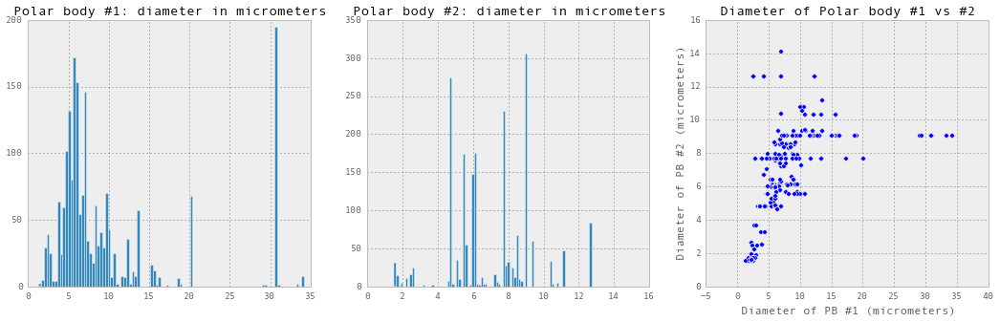

In [129]:
fig, axs = plt.subplots(1,3, figsize=(18,5))
ax1=axs[0]
ax2=axs[1]
ax3=axs[2]

ax1.set_title("Polar body #1: diameter in micrometers")
ax2.set_title("Polar body #2: diameter in micrometers")
ax3.set_title("Diameter of Polar body #1 vs #2")
ax3.set_xlabel("Diameter of PB #1 (micrometers)")
ax3.set_ylabel("Diameter of PB #2 (micrometers)")

df2.polar_body_diameter_1_um.hist(ax=axs[0],bins=100)
df2.polar_body_diameter_2_um.hist(ax=axs[1],bins=100)
plt.scatter(x=df2.polar_body_diameter_1_um, y=df2.polar_body_diameter_2_um)

Have a look what is next.

In [130]:
df2.head(1)

,date,image,objective,time_pf,num_of_cells,meiotic,stage,cell_diameter_um,spindle_length__asters_um,spindle_length_poles_um,...,distance_between_chromosomes_um,microscope,fixation,organism,phylum,classification,genome,chromosomes,day,cleavage_type
0,2013-11-06 00:00:00,131106batstar_35hpf 5,40x,210,1,f,a,177.82149,41.37903,26.13072,...,10.55901,mm40,pf,asterina miniata,echinodermata,bd,811,36,131106,rah


In [131]:
df2.num_of_cells.unique() #this is more of a description of a state

array([1, 2, 4, 8, 16, 26, 12, 64, 128, 32, u'32+', u'64+', 28, nan, 48], dtype=object)

In [132]:
df2.num_of_cells.value_counts()

1      700
2      247
4      241
8      198
16     158
32     155
64      76
64+     57
128     32
28      18
26      13
48      11
12       5
32+      3
dtype: int64

In [133]:
df2.columns
df2.centrosome.value_counts()
df2.centrosome=df2.centrosome.map(lambda x : str(x).replace('F','f'))
df2.centrosome.value_counts()

t      1834
f       149
nan      18
dtype: int64

{'centrosome',
 'classification',
 'cleavage_type',
 'num_of_cells',
 'organism',
 'phylum',
 'polar_body_diameter_2_um',
 'stage',
 'time_pf'}

In [134]:
df2.day = df2.day.map(time_converter)#[1744]

In [135]:
df2.phylum = df2.phylum.str.replace('Chordata','chordata')

In [136]:
[(column,df2[column].value_counts()) for column in df2.columns] #centrosomes: DONE; microscopes #Phyla

[(u'date', 2014-06-03 00:00:00    590
  2013-12-04 00:00:00    159
  2013-05-23 00:00:00    143
  2013-11-25 00:00:00    115
  2014-03-24 00:00:00    108
  2014-01-10 00:00:00    103
  2013-03-08 00:00:00     94
  2020-12-                72
  2010-04-23 00:00:00     65
  2013-11-18 00:00:00     63
  2014-04-25 00:00:00     55
  2014-02-06 00:00:00     55
  2014-06-17 00:00:00     52
  2013-11-21 00:00:00     46
  2013-11-06 00:00:00     34
  2013-11-22 00:00:00     32
  2012-11-02 00:00:00     24
  2014-04-22 00:00:00     22
  2014-07-18 00:00:00     20
  2014-06-04 00:00:00     17
  2014-01-27 00:00:00     11
  2014-04-04 00:00:00      9
  2014-03-07 00:00:00      9
  2014-03-21 00:00:00      7
  2014-02-28 00:00:00      7
  2014-04-24 00:00:00      7
  2014-03-17 00:00:00      6
  2013-11-12 00:00:00      6
  2010-05-22 00:00:00      2
  2012-10-03 00:00:00      1
  2014-01-24 00:00:00      1
  dtype: int64), (u'image', 131121_urchinUrchin_2hrPF 6     18
  131121_urchinUrchin_2hrPF 3

In [137]:
df2.organism = df2.organism.str.replace(' ','_')

In [138]:
names=list(df2.organism.unique())

In [139]:
names=[str(name) for name in names]

In [140]:
names.sort()

In [141]:
len(names)

20

In [142]:
mics=list(df2.microscope.unique())

In [143]:
mics.sort()

In [144]:
mics[0:5]

[nan, u'mm20', u'mm40', u'mm41', u'mm42']

In [145]:
df2.image = df2.image.str.replace(' ','_')
df2.image = df2.image.str.replace('.','_')


In [146]:
df2.image.head()

0     131106batstar_35hpf_5
1     131106batstar_35hpf_6
2     131106batstar_35hpf_7
3    131106batstar_35hpf_10
4    131106batstar_35hpf_11
Name: image, dtype: object

In [147]:
df2.image.value_counts().head()

131121_urchinUrchin_2hrPF_6    18
131121_urchinUrchin_2hrPF_3    15
mus_musculus3                  13
131125_urchinUrchin_27         12
131125_urchinUrchin_26         11
dtype: int64

**Total number of NA's in the dataset:** 

Below is a summary of missing values. Not dealt with in this notebook.

In [153]:
np.sum(df2.isnull())

date                                66
image                                0
objective                            0
time_pf                              0
num_of_cells                        87
meiotic                              0
stage                                8
cell_diameter_um                    54
spindle_length__asters_um          102
spindle_length_poles_um             30
spindle_width_um                   150
spindle_aspect_ratio_asters_um     165
spindle_aspect_ratio_poles_um      165
astere-to-pole_distance_1_um       167
aster-to-pole_distance_2_um        213
inner_aster_diameter_1_um          192
inner_aster_diameter_2_um          289
outer_aster_diameter_1_um          337
outer__diameter_2_um               419
centrosome                           0
metaphase_plate_lengt_h_um         316
metaphase_plate_width_um           789
metaphase_plate_aspect_ratio_um    800
polar_body_diameter_1_um             2
polar_body_diameter_2_um             4
distance_between_chromoso

In [154]:
np.sum(np.sum(df2.isnull()))

5542

In [151]:
np.sum(np.sum(df2.isnull()))/(2001.0*35.0)

0.079131862640108519

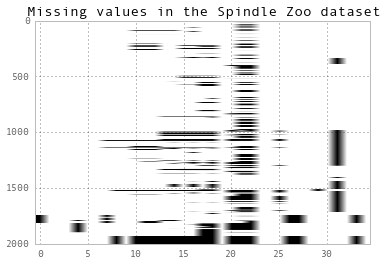

In [155]:
#http://stackoverflow.com/questions/25741214/how-to-use-colormaps-to-color-plots-of-pandas-dataframes
#http://matplotlib.org/examples/color/colormaps_reference.html
#http://stackoverflow.com/questions/9266150/matplotlib-generating-vector-plot # vector graphics
from matplotlib import cm
cmap=cm.get_cmap('Greys')
try: 
    plt.imshow(df2.isnull(),aspect='auto',cmap=cmap)
except TypeError:
    pass
plt.title('Missing values in the Spindle Zoo dataset')
#plt.colorbar()
#plt.savefig('missing_values.eps',format='eps')


Data seems to be clean and uniform. Convert binary categoricals to binaries. Hold off with the rest.

**Potentially irrelevant variables**: image, objective, microscope, (maybe) fixation, (maybe) day and date.   
**Potentially redundant variables**: time_pf and stage, organism and phylum and classification (this is a tree), *day and date (yes, according to Marina), microscope and objective (yes, according to Marina).*

**Continuous variables (19)**:
cell diameter, spindle_length\__asters_um, spindle_length_poles_um, spindle_width_um, spindle_aspect_ratio_asters_um, spindle_aspect_ratio_poles_um, astere-to-pole_distance_1_um, aster-to-pole_distance_2_um, inner_aster_diameter_1_um, inner_aster_diameter_2_um, outer_aster_diameter_1_um, outer__diameter_2_um, 'metaphase_plate_lengt_h_um, metaphase_plate_width_um, metaphase_plate_aspect_ratio_um, polar_body_diameter_1_um, polar_body_diameter_2_um, distance_between_chromosomes_um, (maybe) genome   
**Categorical variables (11)**: time_pf, meiotic (BIN), stage, centrosome (BIN), organism, phylum, classification, cleavage_type, *objective, microscope,fixation, image*  
[Categorical variables in pandas](http://pandas-docs.github.io/pandas-docs-travis/categorical.html)  
**Count variables (2)**: num_of_cells, chromosomes    
**Time/categorical variables (2)**: *date, day*

####Binarize

There are two variables that exist two states: **meiotic** (True/False) and **centrosomes** (True/False). Convert them to 1/0.

In [156]:
df2.columns

Index([u'date', u'image', u'objective', u'time_pf', u'num_of_cells', u'meiotic', u'stage', u'cell_diameter_um', u'spindle_length__asters_um', u'spindle_length_poles_um', u'spindle_width_um', u'spindle_aspect_ratio_asters_um', u'spindle_aspect_ratio_poles_um', u'astere-to-pole_distance_1_um', u'aster-to-pole_distance_2_um', u'inner_aster_diameter_1_um', u'inner_aster_diameter_2_um', u'outer_aster_diameter_1_um', u'outer__diameter_2_um', u'centrosome', u'metaphase_plate_lengt_h_um', u'metaphase_plate_width_um', u'metaphase_plate_aspect_ratio_um', u'polar_body_diameter_1_um', u'polar_body_diameter_2_um', u'distance_between_chromosomes_um', u'microscope', u'fixation', u'organism', u'phylum', u'classification', u'genome', u'chromosomes', u'day', u'cleavage_type'], dtype='object')

In [157]:
df2.meiotic.value_counts()
df2.meiotic.replace({'t':1,'f':0},inplace=True)

In [158]:
df2.meiotic.value_counts()

0    1528
1     473
dtype: int64

In [159]:
df2.centrosome.value_counts()
df2.centrosome.replace({'t':1,'f':0},inplace=True)
df2.centrosome.value_counts()
np.where(df2.centrosome!=0) and np.where(df2.centrosome!=1)
type(df2.centrosome[354]) #str
df2.centrosome.replace(('nan',np.nan),inplace=True)

In [160]:
df2.centrosome.value_counts()

1    1847
0     154
dtype: int64

In [161]:
print df2._get_numeric_data().columns 
print len(df2._get_numeric_data().columns)
print len(df2.columns)

Index([u'time_pf', u'meiotic', u'cell_diameter_um', u'spindle_length__asters_um', u'spindle_length_poles_um', u'spindle_width_um', u'spindle_aspect_ratio_asters_um', u'spindle_aspect_ratio_poles_um', u'astere-to-pole_distance_1_um', u'aster-to-pole_distance_2_um', u'inner_aster_diameter_1_um', u'inner_aster_diameter_2_um', u'outer_aster_diameter_1_um', u'outer__diameter_2_um', u'metaphase_plate_lengt_h_um', u'metaphase_plate_width_um', u'metaphase_plate_aspect_ratio_um', u'polar_body_diameter_1_um', u'distance_between_chromosomes_um', u'genome', u'chromosomes'], dtype='object')
21
35


####Data types
Some variables were read-in as objects instead of primitives due to 'na'. Convert them to desired primitives.

In [162]:
df2.meiotic.dtype,df2.centrosome.dtype,df2.polar_body_diameter_1_um.dtype,df2.polar_body_diameter_2_um.dtype


(dtype('int64'), dtype('O'), dtype('float64'), dtype('O'))

In [163]:
df2.polar_body_diameter_2_um=df2.polar_body_diameter_2_um.astype('float64')

In [164]:
df2.polar_body_diameter_2_um.dtype

dtype('float64')

In [165]:
df2.centrosome=df2.centrosome.astype('int64')

In [166]:
df2.centrosome.dtype

dtype('int64')

In [167]:
df2._get_numeric_data().columns, len(df2._get_numeric_data().columns)

(Index([u'time_pf', u'meiotic', u'cell_diameter_um', u'spindle_length__asters_um', u'spindle_length_poles_um', u'spindle_width_um', u'spindle_aspect_ratio_asters_um', u'spindle_aspect_ratio_poles_um', u'astere-to-pole_distance_1_um', u'aster-to-pole_distance_2_um', u'inner_aster_diameter_1_um', u'inner_aster_diameter_2_um', u'outer_aster_diameter_1_um', u'outer__diameter_2_um', u'centrosome', u'metaphase_plate_lengt_h_um', u'metaphase_plate_width_um', u'metaphase_plate_aspect_ratio_um', u'polar_body_diameter_1_um', u'polar_body_diameter_2_um', u'distance_between_chromosomes_um', u'genome', u'chromosomes'], dtype='object'),
 23)

In [168]:
df2.columns, len(df2.columns)

(Index([u'date', u'image', u'objective', u'time_pf', u'num_of_cells', u'meiotic', u'stage', u'cell_diameter_um', u'spindle_length__asters_um', u'spindle_length_poles_um', u'spindle_width_um', u'spindle_aspect_ratio_asters_um', u'spindle_aspect_ratio_poles_um', u'astere-to-pole_distance_1_um', u'aster-to-pole_distance_2_um', u'inner_aster_diameter_1_um', u'inner_aster_diameter_2_um', u'outer_aster_diameter_1_um', u'outer__diameter_2_um', u'centrosome', u'metaphase_plate_lengt_h_um', u'metaphase_plate_width_um', u'metaphase_plate_aspect_ratio_um', u'polar_body_diameter_1_um', u'polar_body_diameter_2_um', u'distance_between_chromosomes_um', u'microscope', u'fixation', u'organism', u'phylum', u'classification', u'genome', u'chromosomes', u'day', u'cleavage_type'], dtype='object'),
 35)

In [169]:
set(df2.columns).difference(set(df2._get_numeric_data().columns))

{u'classification',
 u'cleavage_type',
 u'date',
 u'day',
 u'fixation',
 u'image',
 u'microscope',
 u'num_of_cells',
 u'objective',
 u'organism',
 u'phylum',
 u'stage'}

In [170]:
df2._get_numeric_data().columns, len(df2._get_numeric_data().columns)
#LATEX
#http://stackoverflow.com/questions/13208286/how-to-write-latex-in-ipython-notebook
#http://www.math.tamu.edu/~boas/courses/math696/LaTeX-in-line-equations.html

(Index([u'time_pf', u'meiotic', u'cell_diameter_um', u'spindle_length__asters_um', u'spindle_length_poles_um', u'spindle_width_um', u'spindle_aspect_ratio_asters_um', u'spindle_aspect_ratio_poles_um', u'astere-to-pole_distance_1_um', u'aster-to-pole_distance_2_um', u'inner_aster_diameter_1_um', u'inner_aster_diameter_2_um', u'outer_aster_diameter_1_um', u'outer__diameter_2_um', u'centrosome', u'metaphase_plate_lengt_h_um', u'metaphase_plate_width_um', u'metaphase_plate_aspect_ratio_um', u'polar_body_diameter_1_um', u'polar_body_diameter_2_um', u'distance_between_chromosomes_um', u'genome', u'chromosomes'], dtype='object'),
 23)

There will be two approaches for the the num_of_cells variable. Whenever we see #+:  
* subsitute for: $\frac{\scriptstyle x+2x}{\scriptstyle 2}$
     
     
* add as a numerical column and convert to CAT. Add as a spurious column.



In [171]:
(32+64)/2

48

**Approach 1:**

In [172]:
#approach 1:
df2.num_of_cells.unique()

array([1, 2, 4, 8, 16, 26, 12, 64, 128, 32, u'32+', u'64+', 28, nan, 48], dtype=object)

In [173]:
num_of_cells_dict=dict(zip(df2.num_of_cells.unique(),range(1,len(df2.num_of_cells.unique())+1)))
num_of_cells_dict[np.nan]=np.nan
df2['num_of_cells_CAT']=df2.num_of_cells.map(lambda x:num_of_cells_dict[x]) #DONE!

**Approach 2:**

In [174]:
#approach 2:
change_cell_num=list(df2.num_of_cells.unique())

In [175]:
change_cell_num.index('64+'),change_cell_num.index('32+'),

(11, 10)

In [176]:
for element in change_cell_num:
    try:
        element = int(element)
    except ValueError:
        element = str(element)

In [177]:
type(change_cell_num[10])

unicode

In [179]:
import re
pattern=re.compile(r'(\d+)\+') #define the pattern

In [180]:
new_change_cell_num=[]
for elem in change_cell_num:
    if pattern.match(str(elem)) == None:
        new_change_cell_num.append(elem)
    if pattern.match(str(elem)) != None:
        new_change_cell_num.append(((int(pattern.match(str(elem)).group(1)))+2*(int(pattern.match(str(elem)).group(1))))/2)

In [181]:
change_cell_num

[1, 2, 4, 8, 16, 26, 12, 64, 128, 32, u'32+', u'64+', 28, nan, 48]

In [182]:
new_change_cell_num

[1, 2, 4, 8, 16, 26, 12, 64, 128, 32, 48, 96, 28, nan, 48]

In [183]:
num_of_cells_dict2=dict(zip(df2.num_of_cells.unique(),new_change_cell_num))
num_of_cells_dict[np.nan]=np.nan
df2['num_of_cells_NUM']=df2.num_of_cells.map(lambda x:num_of_cells_dict2[x]) #DONE!

In [184]:
df2.num_of_cells_NUM

0     1
1     1
2     1
3     1
4     1
5     2
6     2
7     1
8     1
9     1
10    2
11    2
12    1
13    2
14    2
...
1986    2
1987    2
1988    2
1989    2
1990    2
1991    2
1992    1
1993    1
1994    1
1995    1
1996    1
1997    1
1998    1
1999    1
2000    1
Name: num_of_cells_NUM, Length: 2001, dtype: float64

####Categorical variables 

[Use pandas way to deal with the categorical variables, when 0.15.0 is out:](http://pandas-docs.github.io/pandas-docs-travis/categorical.html)  

{'centrosome' (BIN),
 'classification' (4 categories),
 'cleavage_type',
 'num_of_cells',
 'organism',
 'phylum',
 'polar_body_diameter_2_um',
 'stage',
 'time_pf'}   
 Support for categorical variables only from pandas 0.15. For now, convert to ordinals. Not perfect.  
 *Question: could we use the ordinals as a proxy for evolutionary distance?*
 
[PLOTTING CATEGORICAL VARIABLE IN PANDAS](https://gist.github.com/amanahuja/0c2b6f086eed9d6c2fe0 )

In [185]:
df2.classification.value_counts()
type(df2.classification[0])
df2.classification = [str(term) for term in df2.classification]

In [186]:
df2.head()

,date,image,objective,time_pf,num_of_cells,meiotic,stage,cell_diameter_um,spindle_length__asters_um,spindle_length_poles_um,...,fixation,organism,phylum,classification,genome,chromosomes,day,cleavage_type,num_of_cells_CAT,num_of_cells_NUM
0,2013-11-06 00:00:00,131106batstar_35hpf_5,40x,210,1,0,a,177.82149,41.37903,26.13072,...,pf,asterina_miniata,echinodermata,bd,811,36,2013-11-06,rah,1,1
1,2013-11-06 00:00:00,131106batstar_35hpf_6,40x,210,1,0,m,163.05828,24.85329,18.28827,...,pf,asterina_miniata,echinodermata,bd,811,36,2013-11-06,rah,1,1
2,2013-11-06 00:00:00,131106batstar_35hpf_7,40x,210,1,0,p,206.00580,35.08890,27.24645,...,pf,asterina_miniata,echinodermata,bd,811,36,2013-11-06,rah,1,1
3,2013-11-06 00:00:00,131106batstar_35hpf_10,40x,210,1,0,m,194.04000,42.39774,42.39774,...,pf,asterina_miniata,echinodermata,bd,811,36,2013-11-06,rah,1,1
4,2013-11-06 00:00:00,131106batstar_35hpf_11,40x,210,1,0,NaN,180.36018,NaN,NaN,...,pf,asterina_miniata,echinodermata,bd,811,36,2013-11-06,rah,1,1


In [187]:
set(df2.columns).difference(set(df2._get_numeric_data().columns)) #day and date are to be dealt with later

{u'classification',
 u'cleavage_type',
 u'date',
 u'day',
 u'fixation',
 u'image',
 u'microscope',
 u'num_of_cells',
 u'objective',
 u'organism',
 u'phylum',
 u'stage'}

In [188]:
categoricals = list(set(df2.columns).difference(set(df2._get_numeric_data().columns)))

In [189]:
categoricals.remove('day'), categoricals.remove('date')

(None, None)

In [190]:
categoricals


[u'num_of_cells',
 u'classification',
 u'fixation',
 u'image',
 u'microscope',
 u'phylum',
 u'objective',
 u'cleavage_type',
 u'organism',
 u'stage']

In [191]:
df2.classification.value_counts()

bd     1132
bpl     733
bpe     132
r         4
dtype: int64

In [192]:
len(df2.classification.unique())

4

In [193]:
classification_map_dic=dict(zip(list(df2.classification.unique()),range(1,5)))

In [194]:
classification_map_dic

{'bd': 1, 'bpe': 2, 'bpl': 3, 'r': 4}

In [195]:
df2['classification_CAT']=df2.classification.map(lambda x: classification_map_dic[x])

In [196]:
df2.shape

(2001, 38)

In [197]:
df2.phylum.unique()

array([u'echinodermata', u'nematoda', u'nemertea', u'chordata',
       u'annelida', u'mollusca', nan, u'arthropoda', u'Cnidaria',
       u'Chordaya'], dtype=object)

In [198]:
phylum_dict=dict(zip(df2.phylum.unique(),range(1,len(df2.phylum.unique())+1)))

In [199]:
df2['phylum_CAT']=df2.phylum.map(lambda x:phylum_dict[x])

In [200]:
df2.shape

(2001, 39)

In [201]:
df2.organism.unique()

array([u'asterina_miniata', u'caenorhabditis_elegans',
       u'cerebratulus_marginatus', u'ciona_intestinalis',
       u'helobdella_robusta', u'Strongylocentrotus_purpuratus',
       u'urechis_caupo', u'xenopus_laevis', u'mytilus_californianus',
       u'xenopus_tropicalis', u'Equus_caballus', u'Homo_sapiens',
       u'Macaca_mulatta', u'Callithrix_jacchus', u'monodelphis_domestica',
       u'sus_scrofa', u'mus_musculus', u'drosophila_melanogaster',
       u'danio_rerio', u'Clytia_hemisphaerica_1'], dtype=object)

In [202]:
organism_dict=dict(zip(df2.organism.unique(),range(1,len(df2.organism.unique())+1)))

In [203]:
df2['organism_CAT']=df2.organism.map(lambda x:organism_dict[x])

In [204]:
df2.shape

(2001, 40)

In [205]:
df2.cleavage_type.unique()

array([u'rah', u'ro', u'sp', u'b', u's', u'dra', u'sf', u'dm', u'ir'], dtype=object)

In [206]:
cleavage_dict=dict(zip(df2.cleavage_type.unique(),range(1,len(df2.cleavage_type.unique())+1)))
cleavage_dict[np.nan]=np.nan

In [207]:
cleavage_dict

{nan: nan,
 u'b': 4,
 u'dm': 8,
 u'dra': 6,
 u'ir': 9,
 u'rah': 1,
 u'ro': 2,
 u's': 5,
 u'sf': 7,
 u'sp': 3}

In [208]:
df2['cleavage_type_CAT']=df2.cleavage_type.map(lambda x:cleavage_dict[x])

In [209]:
df2.fixation.unique()

array([u'pf', u'df', u'm', nan], dtype=object)

In [210]:
fixation_dict=dict(zip(df2.fixation.unique(),range(1,len(df2.fixation.unique())+1)))
fixation_dict[np.nan]=np.nan
df2['fixation_CAT']=df2.fixation.map(lambda x:fixation_dict[x])

In [211]:
df2.objective.unique() #Marina says to skip this one 

array(['40x', '20x', '40x-zlsm', '63x', '40x-olf', '20x-zlsm', '60x', 'nan'], dtype=object)

In [212]:
df2.microscope.unique()

array([u'mm40', u'mm20', u'zlsm40', u'nsd60', u'nsd61', u'nsd62', u'nsd63',
       u'nsd64', u'nsd65', u'nsd66', u'nsd67', u'nsd68', u'nsd69',
       u'nsd70', u'nsd71', u'nsd72', u'nsd73', u'nsd74', u'nsd75',
       u'nsd76', u'nsd77', u'nsd78', u'olf', u'zlsm20', u'mm60', u'zlsm21',
       u'zlsm22', u'zlsm23', u'zlsm24', u'zlsm25', u'zlsm26', u'zlsm27',
       u'zlsm28', u'zlsm29', u'zlsm30', u'zlsm31', u'zlsm32', u'zlsm33',
       u'zlsm34', u'zlsm35', u'mm41', u'mm42', u'mm43', u'mm44', u'mm45',
       u'mm46', u'mm47', u'mm48', nan, u'zax20'], dtype=object)

In [213]:
microscope_dict=dict(zip(df2.microscope.unique(),range(1,len(df2.microscope.unique())+1)))
microscope_dict[np.nan]=np.nan
df2['microscope_CAT']=df2.microscope.map(lambda x:microscope_dict[x])

In [214]:
df2.stage.unique()

array([u'a', u'm', u'p', nan, u'mII', u'aII', u'mI', u'aI', u'i', u'pI'], dtype=object)

In [215]:
df2.stage.value_counts()

m      1165
a       415
mI      201
mII      96
aI       48
pI       47
aII      11
p         7
i         3
dtype: int64

In [216]:
stage_dict=dict(zip(df2.stage.unique(),range(1,len(df2.stage.unique())+1)))
stage_dict[np.nan]=np.nan
df2['stage_CAT']=df2.stage.map(lambda x:stage_dict[x])

In [217]:
df2.stage.value_counts()

m      1165
a       415
mI      201
mII      96
aI       48
pI       47
aII      11
p         7
i         3
dtype: int64

In [218]:
len(df2.stage[df2.stage.isnull()])

8

In [219]:
stage_dict[np.nan]

nan

In [220]:
type(df2.stage[4])

float

In [221]:
df2._get_numeric_data().columns, len(df2._get_numeric_data().columns)

(Index([u'time_pf', u'meiotic', u'cell_diameter_um', u'spindle_length__asters_um', u'spindle_length_poles_um', u'spindle_width_um', u'spindle_aspect_ratio_asters_um', u'spindle_aspect_ratio_poles_um', u'astere-to-pole_distance_1_um', u'aster-to-pole_distance_2_um', u'inner_aster_diameter_1_um', u'inner_aster_diameter_2_um', u'outer_aster_diameter_1_um', u'outer__diameter_2_um', u'centrosome', u'metaphase_plate_lengt_h_um', u'metaphase_plate_width_um', u'metaphase_plate_aspect_ratio_um', u'polar_body_diameter_1_um', u'polar_body_diameter_2_um', u'distance_between_chromosomes_um', u'genome', u'chromosomes', u'num_of_cells_CAT', u'num_of_cells_NUM', u'classification_CAT', u'phylum_CAT', u'organism_CAT', u'cleavage_type_CAT', u'fixation_CAT', u'microscope_CAT', u'stage_CAT'], dtype='object'),
 32)

In [222]:
df2.columns, len(df2.columns)

(Index([u'date', u'image', u'objective', u'time_pf', u'num_of_cells', u'meiotic', u'stage', u'cell_diameter_um', u'spindle_length__asters_um', u'spindle_length_poles_um', u'spindle_width_um', u'spindle_aspect_ratio_asters_um', u'spindle_aspect_ratio_poles_um', u'astere-to-pole_distance_1_um', u'aster-to-pole_distance_2_um', u'inner_aster_diameter_1_um', u'inner_aster_diameter_2_um', u'outer_aster_diameter_1_um', u'outer__diameter_2_um', u'centrosome', u'metaphase_plate_lengt_h_um', u'metaphase_plate_width_um', u'metaphase_plate_aspect_ratio_um', u'polar_body_diameter_1_um', u'polar_body_diameter_2_um', u'distance_between_chromosomes_um', u'microscope', u'fixation', u'organism', u'phylum', u'classification', u'genome', u'chromosomes', u'day', u'cleavage_type', u'num_of_cells_CAT', u'num_of_cells_NUM', u'classification_CAT', u'phylum_CAT', u'organism_CAT', u'cleavage_type_CAT', u'fixation_CAT', u'microscope_CAT', u'stage_CAT'], dtype='object'),
 44)

In [223]:
set(df2.columns).difference(df2._get_numeric_data().columns)

{u'classification',
 u'cleavage_type',
 u'date',
 u'day',
 u'fixation',
 u'image',
 u'microscope',
 u'num_of_cells',
 u'objective',
 u'organism',
 u'phylum',
 u'stage'}

In [224]:
df2.microscope.unique()

array([u'mm40', u'mm20', u'zlsm40', u'nsd60', u'nsd61', u'nsd62', u'nsd63',
       u'nsd64', u'nsd65', u'nsd66', u'nsd67', u'nsd68', u'nsd69',
       u'nsd70', u'nsd71', u'nsd72', u'nsd73', u'nsd74', u'nsd75',
       u'nsd76', u'nsd77', u'nsd78', u'olf', u'zlsm20', u'mm60', u'zlsm21',
       u'zlsm22', u'zlsm23', u'zlsm24', u'zlsm25', u'zlsm26', u'zlsm27',
       u'zlsm28', u'zlsm29', u'zlsm30', u'zlsm31', u'zlsm32', u'zlsm33',
       u'zlsm34', u'zlsm35', u'mm41', u'mm42', u'mm43', u'mm44', u'mm45',
       u'mm46', u'mm47', u'mm48', nan, u'zax20'], dtype=object)

In [225]:
df2.objective.unique()

array(['40x', '20x', '40x-zlsm', '63x', '40x-olf', '20x-zlsm', '60x', 'nan'], dtype=object)

df2 is ready for export. This is the data frame that is worth loading to SQL DB. 

Remove the '#' from the file below to save the processed data file.

In [243]:
#df2.to_csv('../Data/df2_original_for_SQL.csv',index=False)

In [244]:
df2.shape

(2001, 44)

# 3. Exploratory plots

####Temporal data - simple count

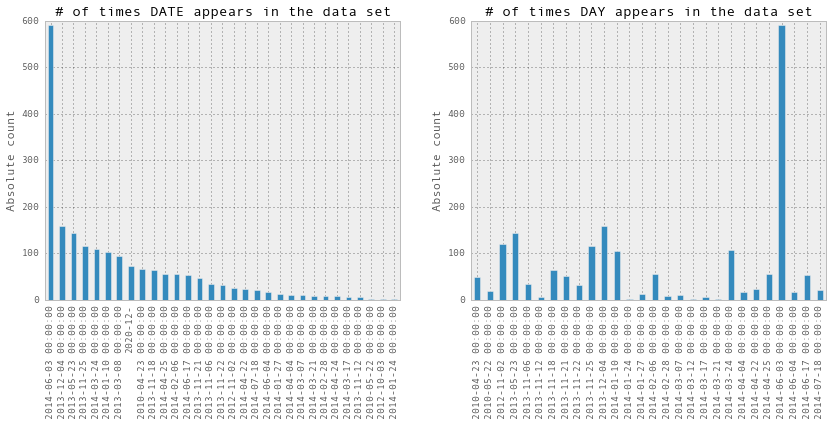

In [245]:
fig, axs = plt.subplots(1,2, figsize=(14,5))

import matplotlib.dates
date_df=df2.date.value_counts()
type(date_df)
#date_df=date_df.sort_index(ascending=True)
my_plot=date_df.plot(kind='bar',use_index=True,ax=axs[0])

day_df=df2.day.value_counts()
day_df=day_df.sort_index(ascending=True)

my_plot2=day_df.plot(kind='bar',use_index=True,ax=axs[1])

ax1=axs[0]
ax2=axs[1]

ax1.set_title("# of times DATE appears in the data set")
ax1.set_ylabel('Absolute count')
ax2.set_title("# of times DAY appears in the data set")
ax2.set_ylabel('Absolute count')



my_plot.get_xticks()
my_plot.get_xticklabels()[0]

#my_plot.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%Y-%m-%d'))

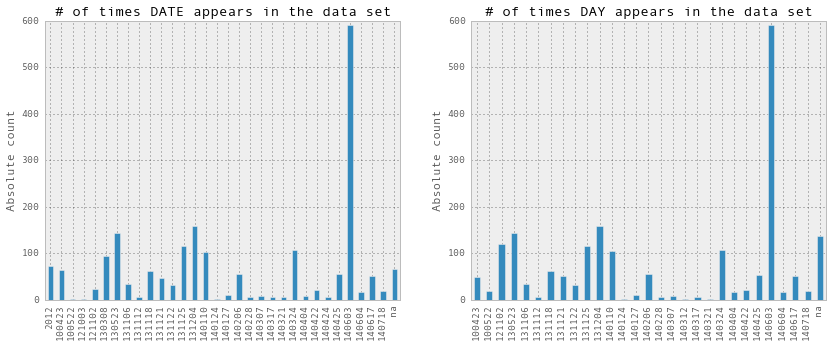

In [246]:
fig, axs = plt.subplots(1,2, figsize=(14,5))

#import matplotlib.dates
date_df=df2a.date.value_counts()
type(date_df)
date_df=date_df.sort_index(ascending=True)
my_plot=date_df.plot(kind='bar',use_index=True,ax=axs[0])

day_df=df2a.day.value_counts()
day_df=day_df.sort_index(ascending=True)

my_plot2=day_df.plot(kind='bar',use_index=True,ax=axs[1])

ax1=axs[0]
ax2=axs[1]

ax1.set_title("# of times DATE appears in the data set")
ax1.set_ylabel('Absolute count')
ax2.set_title("# of times DAY appears in the data set")
ax2.set_ylabel('Absolute count')



my_plot.get_xticks()
my_plot.get_xticklabels()[0]

#my_plot.xaxis.set_major_formatter(matplotlib.dates.DateFormatter('%Y-%m-%d'))

Introducing ***df3***. Will be used to drop the potentially irrelevant variables (e.g. for exploratory analysis).

In [247]:
df3 = df2.copy()
#df3.to_csv('../Data/original.csv',index=False)

Try dropping the potentially irrelevant variables. Use them later for sanity check. Dropping:  image, objective (redundant with microscope), (for now) day and date. Substitute day with the original numbers from df.

In [248]:
df3=df3.drop(['image', 'objective','day','date'], axis=1)

In [249]:
df3.head(1)

,time_pf,num_of_cells,meiotic,stage,cell_diameter_um,spindle_length__asters_um,spindle_length_poles_um,spindle_width_um,spindle_aspect_ratio_asters_um,spindle_aspect_ratio_poles_um,...,cleavage_type,num_of_cells_CAT,num_of_cells_NUM,classification_CAT,phylum_CAT,organism_CAT,cleavage_type_CAT,fixation_CAT,microscope_CAT,stage_CAT
0,210,1,0,a,177.82149,41.37903,26.13072,14.45598,2.862416,1.807606,...,rah,1,1,1,1,1,1,1,1,1


In [250]:
df3['day_old']=df2a.day

Remove the '#' from the file below to save the processed data file.

In [251]:
#df3.to_csv('../Data/original.csv',index=False)

In [252]:
df3.head()

,time_pf,num_of_cells,meiotic,stage,cell_diameter_um,spindle_length__asters_um,spindle_length_poles_um,spindle_width_um,spindle_aspect_ratio_asters_um,spindle_aspect_ratio_poles_um,...,num_of_cells_CAT,num_of_cells_NUM,classification_CAT,phylum_CAT,organism_CAT,cleavage_type_CAT,fixation_CAT,microscope_CAT,stage_CAT,day_old
0,210,1,0,a,177.82149,41.37903,26.13072,14.45598,2.862416,1.807606,...,1,1,1,1,1,1,1,1,1,131106
1,210,1,0,m,163.05828,24.85329,18.28827,9.97689,2.491086,1.833063,...,1,1,1,1,1,1,1,1,2,131106
2,210,1,0,p,206.00580,35.08890,27.24645,14.63385,2.397790,1.861878,...,1,1,1,1,1,1,1,1,3,131106
3,210,1,0,m,194.04000,42.39774,42.39774,17.46360,2.427778,2.427778,...,1,1,1,1,1,1,1,1,2,131106
4,210,1,0,NaN,180.36018,NaN,NaN,NaN,NaN,NaN,...,1,1,1,1,1,1,1,1,NaN,131106


#### HISTOGRAMS

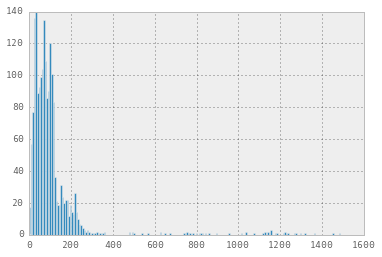

In [253]:
df3.cell_diameter_um.hist(bins=200)
#plt

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x111610b10>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x112af5c50>]], dtype=object)

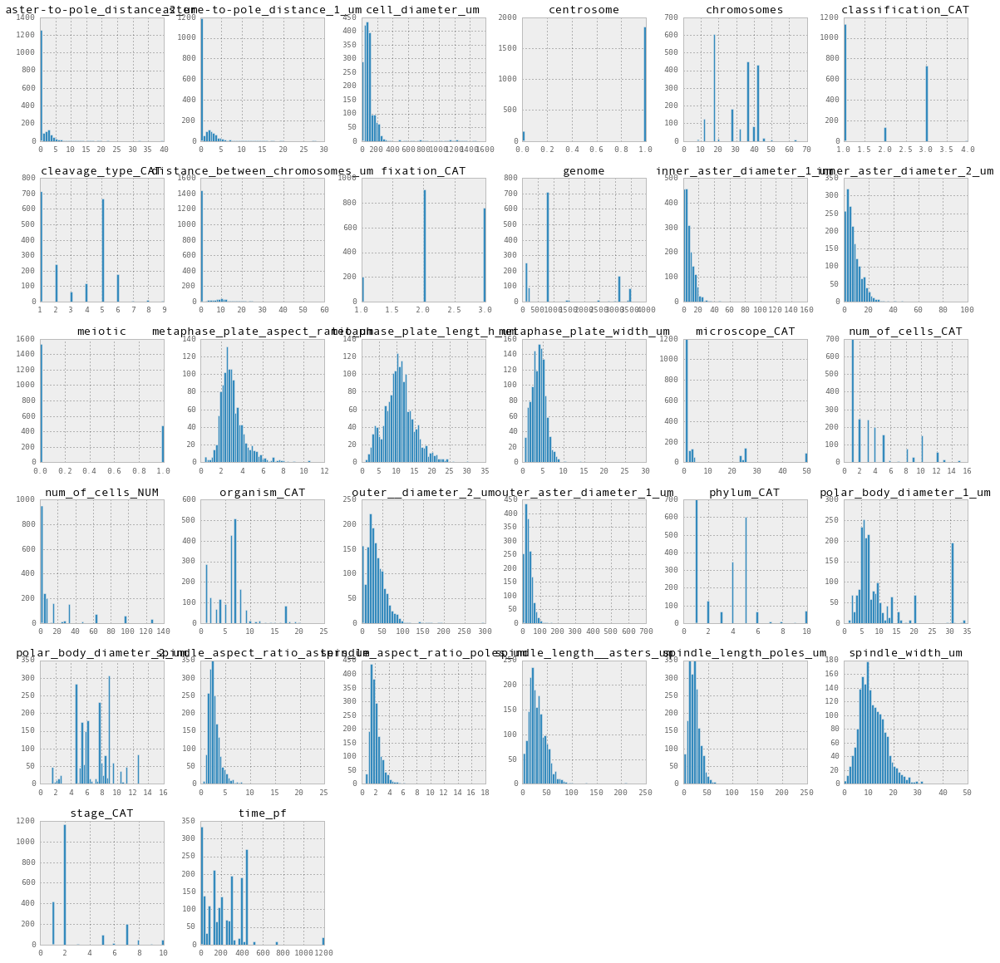

In [254]:
df3.hist(bins = 50,figsize=(20,20))

In [256]:
from pandas.tools.plotting import scatter_matrix

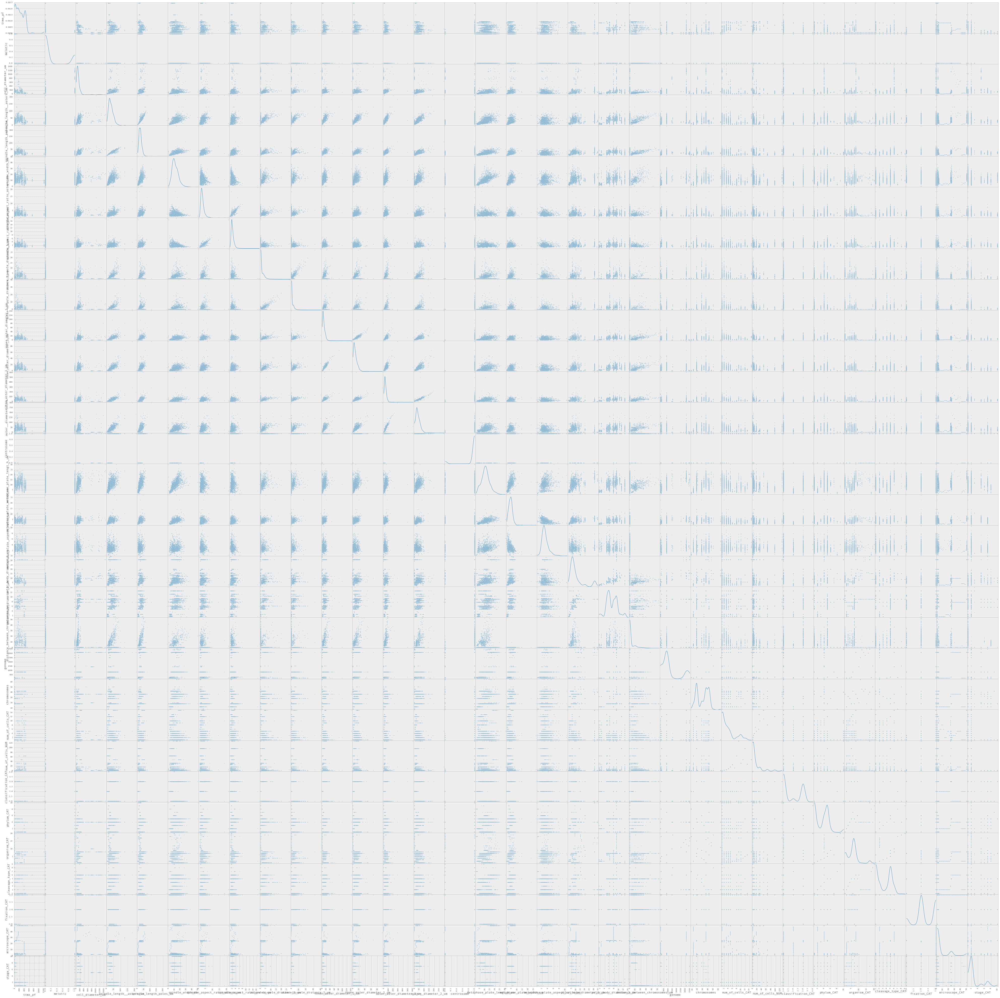

In [257]:
scat = scatter_matrix(df3, figsize = (70,70), diagonal = 'kde')
#plt.savefig('scatter_matrix_complete_numeric.eps')
#df3.iloc[:,0:6]
#plt.bar(df3.stage,df3.cell_diameter_um)

There are some variables still missing. It currently uses 20 out of 29 variables. Which ones are not used?
{'centrosome'(OK),
 'classification'(CAT),
 'cleavage_type'(CAT),
 'num_of_cells'(CAT),
 'organism'(CAT),
 'phylum'(CAT),
 'polar_body_diameter_2_um' (OK),
 'stage'(CAT),
 'time_pf'(OK)}
FiXED: centrosomes, time_pf, polar_body_diameter_2_um

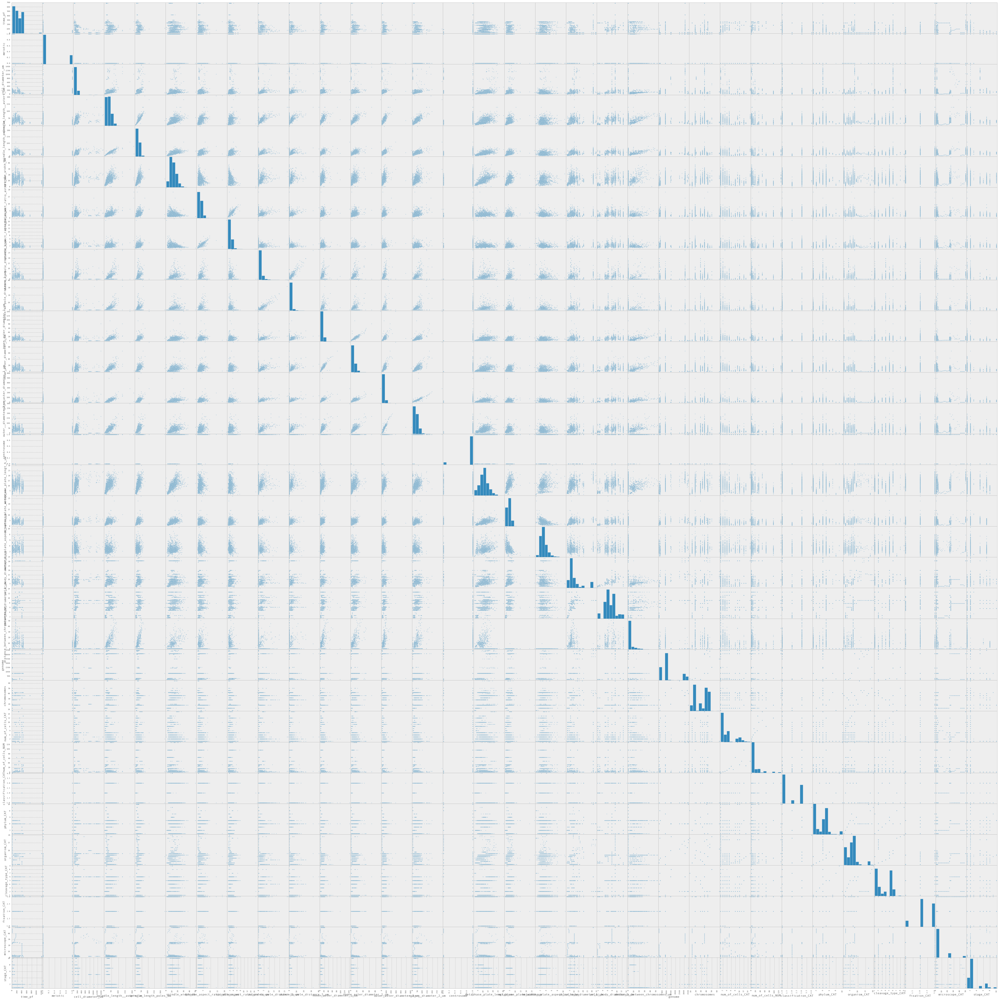

In [258]:
scat2 = scatter_matrix(df3, figsize = (70,70))
#plt.savefig('scatter_matrix_complete_numeric_histogram.eps')

In [259]:
np.size(scat)

1024

In [260]:
np.sqrt(np.size(scat))

32.0

In [261]:
var_list=[str(name) for name in list(df3.columns)]
var_set=set(var_list)

In [262]:
len(var_set),var_set

(41,
 {'aster-to-pole_distance_2_um',
  'astere-to-pole_distance_1_um',
  'cell_diameter_um',
  'centrosome',
  'chromosomes',
  'classification',
  'classification_CAT',
  'cleavage_type',
  'cleavage_type_CAT',
  'day_old',
  'distance_between_chromosomes_um',
  'fixation',
  'fixation_CAT',
  'genome',
  'inner_aster_diameter_1_um',
  'inner_aster_diameter_2_um',
  'meiotic',
  'metaphase_plate_aspect_ratio_um',
  'metaphase_plate_lengt_h_um',
  'metaphase_plate_width_um',
  'microscope',
  'microscope_CAT',
  'num_of_cells',
  'num_of_cells_CAT',
  'num_of_cells_NUM',
  'organism',
  'organism_CAT',
  'outer__diameter_2_um',
  'outer_aster_diameter_1_um',
  'phylum',
  'phylum_CAT',
  'polar_body_diameter_1_um',
  'polar_body_diameter_2_um',
  'spindle_aspect_ratio_asters_um',
  'spindle_aspect_ratio_poles_um',
  'spindle_length__asters_um',
  'spindle_length_poles_um',
  'spindle_width_um',
  'stage',
  'stage_CAT',
  'time_pf'})

In [263]:
#s.yaxis.label.get_text()
plotted_vars=[]
for i in range(int(np.sqrt(np.size(scat)))):
    s = scat[i,0]
    plotted_vars.append(s.yaxis.label.get_text())
plotted_var_set=set(plotted_vars)

In [264]:
len(plotted_var_set), plotted_var_set

(32,
 {u'aster-to-pole_distance_2_um',
  u'astere-to-pole_distance_1_um',
  u'cell_diameter_um',
  u'centrosome',
  u'chromosomes',
  u'classification_CAT',
  u'cleavage_type_CAT',
  u'distance_between_chromosomes_um',
  u'fixation_CAT',
  u'genome',
  u'inner_aster_diameter_1_um',
  u'inner_aster_diameter_2_um',
  u'meiotic',
  u'metaphase_plate_aspect_ratio_um',
  u'metaphase_plate_lengt_h_um',
  u'metaphase_plate_width_um',
  u'microscope_CAT',
  u'num_of_cells_CAT',
  u'num_of_cells_NUM',
  u'organism_CAT',
  u'outer__diameter_2_um',
  u'outer_aster_diameter_1_um',
  u'phylum_CAT',
  u'polar_body_diameter_1_um',
  u'polar_body_diameter_2_um',
  u'spindle_aspect_ratio_asters_um',
  u'spindle_aspect_ratio_poles_um',
  u'spindle_length__asters_um',
  u'spindle_length_poles_um',
  u'spindle_width_um',
  u'stage_CAT',
  u'time_pf'})

In [265]:
var_set.difference(plotted_var_set) #fixed centrosomes

{'classification',
 'cleavage_type',
 'day_old',
 'fixation',
 'microscope',
 'num_of_cells',
 'organism',
 'phylum',
 'stage'}

**Below are two scatter matrices: for meiotic and mitotic spindles only**

In [266]:
#split the original matrix
df3.head()
print df3.shape
df3.meiotic.head()
np.sum(df3.meiotic==0), np.sum(df3.meiotic==1), np.sum(df3.meiotic.isnull()),np.sum(df3.meiotic==0)+ np.sum(df3.meiotic==1)

(2001, 41)


(1528, 473, 0, 2001)

In [267]:
df3.head()

,time_pf,num_of_cells,meiotic,stage,cell_diameter_um,spindle_length__asters_um,spindle_length_poles_um,spindle_width_um,spindle_aspect_ratio_asters_um,spindle_aspect_ratio_poles_um,...,num_of_cells_CAT,num_of_cells_NUM,classification_CAT,phylum_CAT,organism_CAT,cleavage_type_CAT,fixation_CAT,microscope_CAT,stage_CAT,day_old
0,210,1,0,a,177.82149,41.37903,26.13072,14.45598,2.862416,1.807606,...,1,1,1,1,1,1,1,1,1,131106
1,210,1,0,m,163.05828,24.85329,18.28827,9.97689,2.491086,1.833063,...,1,1,1,1,1,1,1,1,2,131106
2,210,1,0,p,206.00580,35.08890,27.24645,14.63385,2.397790,1.861878,...,1,1,1,1,1,1,1,1,3,131106
3,210,1,0,m,194.04000,42.39774,42.39774,17.46360,2.427778,2.427778,...,1,1,1,1,1,1,1,1,2,131106
4,210,1,0,NaN,180.36018,NaN,NaN,NaN,NaN,NaN,...,1,1,1,1,1,1,1,1,NaN,131106


In [268]:
grouped = df3.groupby('meiotic')

In [269]:
type(grouped), len(grouped)
for group in grouped:
    print type(group)

type(grouped)
grouped.describe()

<type 'tuple'>
<type 'tuple'>


aster-to-pole_distance_2_um  astere-to-pole_distance_1_um  \
meiotic                                                                    
0       count                  1370.000000                   1395.000000   
        mean                      1.444982                      1.543719   
        std                       2.939563                      2.697953   
        min                       0.000000                      0.000000   
        25%                       0.000000                      0.000000   
        50%                       0.000000                      0.000000   
        75%                       2.240138                      2.457840   
        max                      39.800000                     28.000000   
1       count                   418.000000                    439.000000   
        mean                      0.161477                      0.240937   
        std                       0.568500                      0.901261   
        min                       0.000000                      0.000000   
        25%                       0.000000                      0.000000   
        50%                       0.000000                      0.000000   
        75%                       0.000000                      0.000000   
        max                       3.686760                      9.159900   

               cell_diameter_um   centrosome  chromosomes  classification_CAT  \
meiotic                                                                         
0       count       1517.000000  1528.000000  1528.000000         1528.000000   
        mean          87.476237     0.982330    30.667539            1.683901   
        std          116.411259     0.131793    10.788650            0.909214   
        min            0.100000     0.000000     8.000000            1.000000   
        25%           34.571460     1.000000    18.000000            1.000000   
        50%           64.600000     1.000000    36.000000            1.000000   
        75%          100.852290     1.000000    42.000000            3.000000   
        max         1486.643200     1.000000    50.000000            3.000000   
1       count        430.000000   473.000000   469.000000          473.000000   
        mean         184.029845     0.731501    26.575693            2.194503   
        std          240.496766     0.443648    10.719477            0.974360   
        min           35.687190     0.000000     8.000000            1.000000   
        25%           92.176750     0.000000    18.000000            1.000000   
        50%          107.732625     1.000000    28.000000            3.000000   
        75%          170.132655     1.000000    36.000000            3.000000   
        max         1321.123320     1.000000    64.000000            4.000000   

               cleavage_type_CAT  distance_between_chromosomes_um  \
meiotic                                                             
0       count        1528.000000                      1484.000000   
        mean            2.950916                         3.919504   
        std             1.967203                         8.212102   
        min             1.000000                         0.000000   
        25%             1.000000                         0.000000   
        50%             2.000000                         0.000000   
        75%             5.000000                         3.808035   
        max             8.000000                        52.698030   
1       count         473.000000                       402.000000   
        mean            4.029598                         1.212698   
        std             1.799003                         3.353197   
        min             1.000000                         0.000000   
        25%             2.000000                         0.000000   
        50%             5.000000                         0.000000   
        75%             5.000000                         0.000000   
        max   

In [270]:
type(grouped)
meiotic_false=grouped.get_group(0)



In [271]:
type(meiotic_false)

pandas.core.frame.DataFrame

In [272]:
meiotic_true=grouped.get_group(1)
meiotic_false.shape, meiotic_true.shape



((1528, 40), (473, 40))

In [273]:
type(meiotic_true)

pandas.core.frame.DataFrame

In [274]:
type(meiotic_false),type(meiotic_true)

(pandas.core.frame.DataFrame, pandas.core.frame.DataFrame)

In [277]:
#meiotic_false.to_csv('../Data/meiotic_false.csv',index=False)
#meiotic_true.to_csv('../Data/meiotic_true.csv',index=False)
#df3.to_csv('../Data/original.csv',index=False)

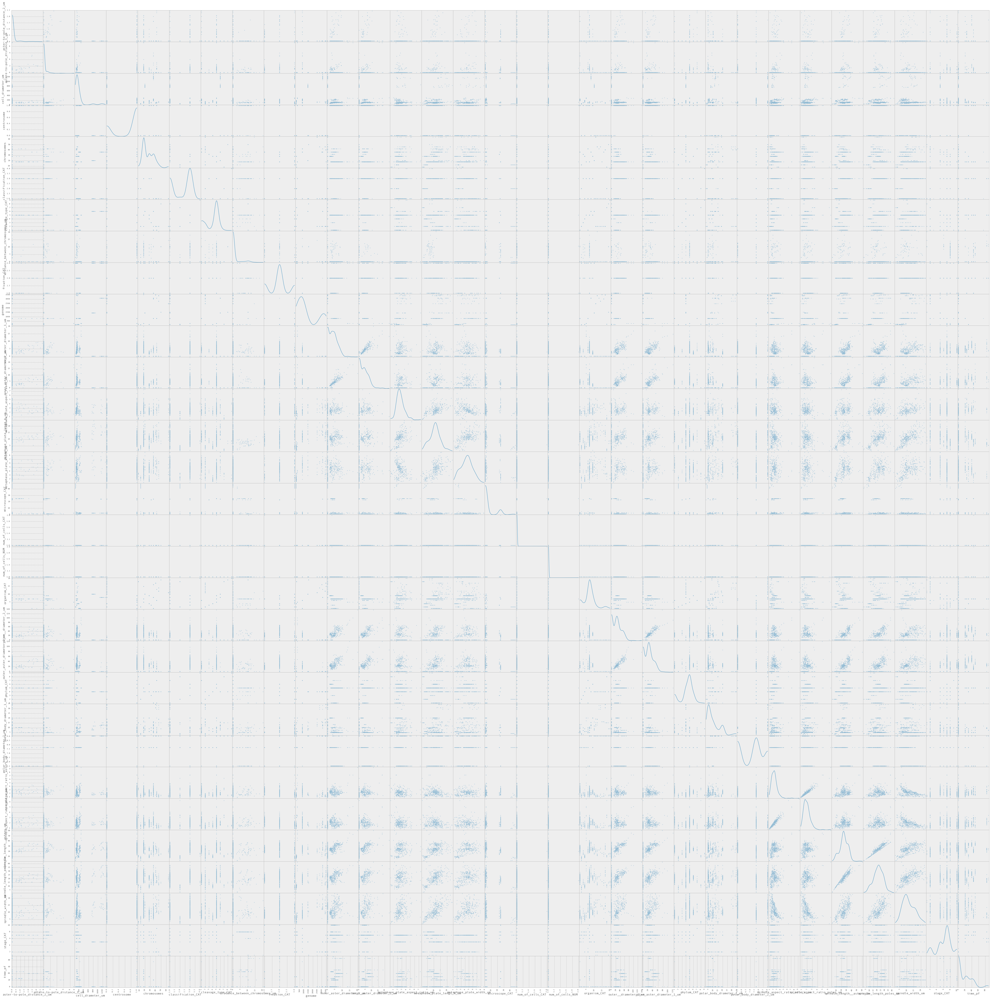

In [278]:
scat_meiotic = scatter_matrix(meiotic_true, figsize = (70,70), diagonal = 'kde')
#plt.savefig('scatter_matrix_meiotic_complete_numeric.eps')

In [279]:
scat_meiotic.shape

(31, 31)

In [280]:
#df_meiotic_false_no_cent=df_meiotic_false.drop('centrosome',axis=1) # from diagnostic notebook
meiotic_false_no_cent = meiotic_false.drop('centrosome',axis = 1)

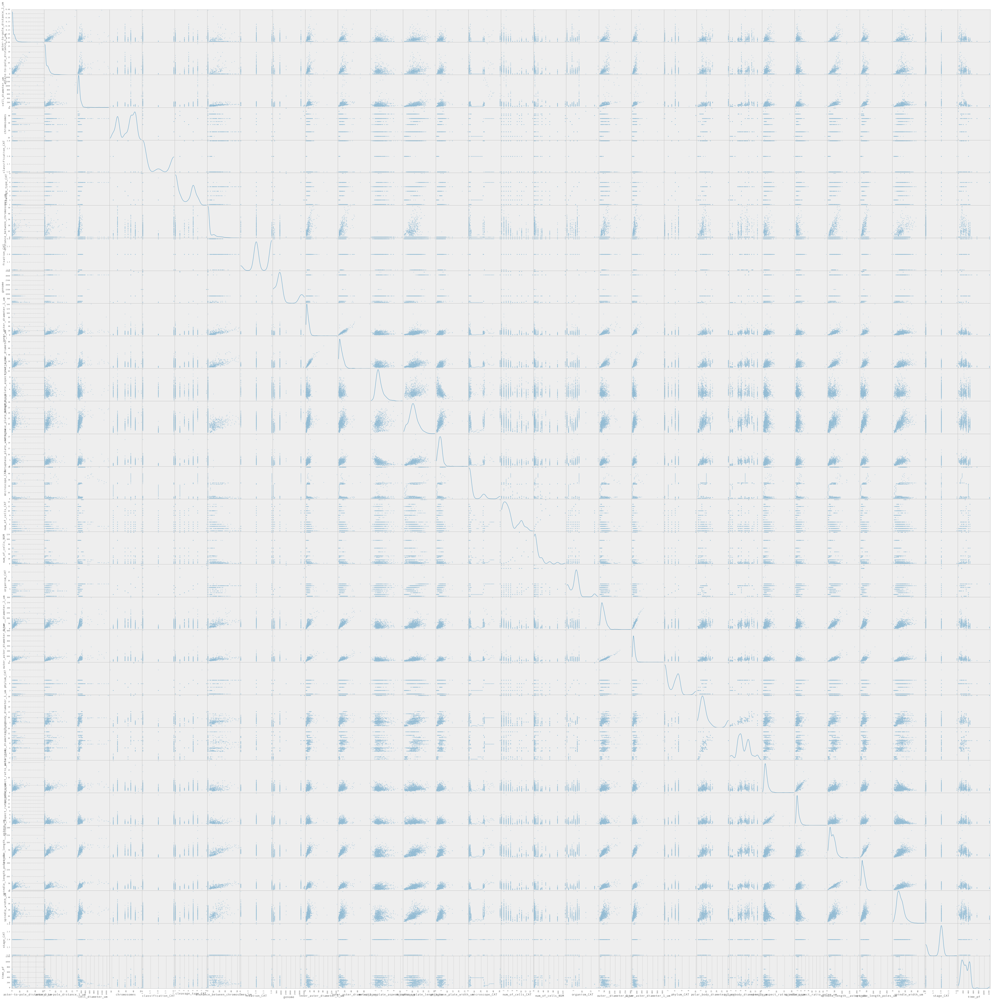

In [281]:
#scat_mitotic = scatter_matrix(meiotic_false, figsize = (70,70))
#plt.savefig('scatter_matrix_mitotic_complete_numeric.eps')
#meiotic_true.shape
#meiotic_false.shape
scat_mitotic = scatter_matrix(meiotic_false_no_cent, figsize = (70,70),diagonal = 'kde')

In [282]:
df3.columns

Index([u'time_pf', u'num_of_cells', u'meiotic', u'stage', u'cell_diameter_um', u'spindle_length__asters_um', u'spindle_length_poles_um', u'spindle_width_um', u'spindle_aspect_ratio_asters_um', u'spindle_aspect_ratio_poles_um', u'astere-to-pole_distance_1_um', u'aster-to-pole_distance_2_um', u'inner_aster_diameter_1_um', u'inner_aster_diameter_2_um', u'outer_aster_diameter_1_um', u'outer__diameter_2_um', u'centrosome', u'metaphase_plate_lengt_h_um', u'metaphase_plate_width_um', u'metaphase_plate_aspect_ratio_um', u'polar_body_diameter_1_um', u'polar_body_diameter_2_um', u'distance_between_chromosomes_um', u'microscope', u'fixation', u'organism', u'phylum', u'classification', u'genome', u'chromosomes', u'cleavage_type', u'num_of_cells_CAT', u'num_of_cells_NUM', u'classification_CAT', u'phylum_CAT', u'organism_CAT', u'cleavage_type_CAT', u'fixation_CAT', u'microscope_CAT', u'stage_CAT', u'day_old'], dtype='object')

In [283]:
pattern2=re.compile(r'.*_CAT')

In [284]:
list_to_drop=[]
for elem in df3.columns:
    if re.match(pattern2,elem)!= None:
        list_to_drop.append(elem.split('C')[0][:-1])

In [285]:
list_to_drop

['num_of_cells',
 'classification',
 'phylum',
 'organism',
 'cleavage_type',
 'fixation',
 'microscope',
 'stage']

**Additional pre-processing: for R size plots**

In [286]:
df3.stage_CAT[0:4],df3.stage[0:4] #metaphase = 2, anaphase = 1, prophase = 3

(0    1
 1    2
 2    3
 3    2
 Name: stage_CAT, dtype: float64, 0    a
 1    m
 2    p
 3    m
 Name: stage, dtype: object)

In [287]:
df3.stage_CAT.value_counts() #metaphase = 2, anaphase = 1, prophase = 3

2     1165
1      415
7      201
5       96
8       48
10      47
6       11
3        7
9        3
dtype: int64

In [288]:
df3.stage.value_counts()

m      1165
a       415
mI      201
mII      96
aI       48
pI       47
aII      11
p         7
i         3
dtype: int64

In [289]:
df3.columns

Index([u'time_pf', u'num_of_cells', u'meiotic', u'stage', u'cell_diameter_um', u'spindle_length__asters_um', u'spindle_length_poles_um', u'spindle_width_um', u'spindle_aspect_ratio_asters_um', u'spindle_aspect_ratio_poles_um', u'astere-to-pole_distance_1_um', u'aster-to-pole_distance_2_um', u'inner_aster_diameter_1_um', u'inner_aster_diameter_2_um', u'outer_aster_diameter_1_um', u'outer__diameter_2_um', u'centrosome', u'metaphase_plate_lengt_h_um', u'metaphase_plate_width_um', u'metaphase_plate_aspect_ratio_um', u'polar_body_diameter_1_um', u'polar_body_diameter_2_um', u'distance_between_chromosomes_um', u'microscope', u'fixation', u'organism', u'phylum', u'classification', u'genome', u'chromosomes', u'cleavage_type', u'num_of_cells_CAT', u'num_of_cells_NUM', u'classification_CAT', u'phylum_CAT', u'organism_CAT', u'cleavage_type_CAT', u'fixation_CAT', u'microscope_CAT', u'stage_CAT', u'day_old'], dtype='object')

In [290]:
grouped2_mitotic_metaphase=meiotic_false.groupby('stage_CAT')


In [291]:
df3.stage.describe()

count     1993
unique       9
top          m
freq      1165
Name: stage, dtype: object

In [292]:
df3.stage.value_counts()

m      1165
a       415
mI      201
mII      96
aI       48
pI       47
aII      11
p         7
i         3
dtype: int64

In [293]:
df3.stage.count()

1993

In [294]:
grouped2_mitotic_metaphase.size() #1 - anaphase, 2 - metaphase, 3-prophase

stage_CAT
1             411
2            1106
3               6
dtype: int64

In [295]:
mitotic_anaphase = grouped2_mitotic_metaphase.get_group(1) #anaphase

In [296]:
mitotic_metaphase = grouped2_mitotic_metaphase.get_group(2) #anaphase

Remove '#' to save the files.

In [298]:
#mitotic_anaphase.to_csv('../Data/mitotic_anaphase.csv',index=False)
#mitotic_metaphase.to_csv('../Data/mitotic_metaphase.csv',index=False)